In [29]:
import math
import os
import sys

import meep.adjoint as mpa
import numpy as np
from autograd import grad
from autograd import numpy as npa
from autograd import tensor_jacobian_product
from matplotlib import pyplot as plt
from matplotlib.patches import Circle
import seaborn as sns
from scipy import signal, special

import meep as mp
import nlopt  # need install nlopt
plt.style.use("seaborn")

%matplotlib inline
%config InlineBackend.figure_format = 'svg'
np.random.seed(0)

os.environ["KMP_DUPLICATE_LIB_OK"] = "TRUE"
# mp.verbosity(0)
cur_path = os.getcwd()


/tmp/ipykernel_296773/1205934410.py:17: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn")


**init_file**

In [30]:
# init_file
evaluation_histary_files = []
eps_files = []
epses = []
# wg_length = 0
# wg_length = 0
# wg_eps = 1.96**2 * np.ones(shape=(int(wg_length / 0.02), 12))
for scatter_angle in [0]:
    sub_file = cur_path + "/init_segmented_opt/"
    evaluation_histary_file = sub_file + f"eval_history_seg_init_{scatter_angle}.npy"
    eps_file = sub_file + f"final_eps_seg_init_{scatter_angle}.npy"
    evaluation_histary_files.append(evaluation_histary_file)
    eps = np.load(eps_file)
    epses.append(eps)
    # epses.append(wg_eps)
# wg_gap数量与eps数量相同
wg_gap = []
wg_gap.append(0)
wg_gap.append(0)
# total_eps = np.concatenate(epses, axis=0)

**segmented_angle_opt**

In [ ]:
evaluation_histary_files = []
eps_files = []
epses = []
# wg_length = 0.03620286803085843
wg_length = 0
wg_eps = 1.96**2 * np.ones(shape=(int(wg_length / 0.02), 12))
for scatter_angle in [-7.5, -2.5]:
    sub_file = cur_path + "/seg_angle_opt/"
    evaluation_histary_file = sub_file + f"eval_history_seg_angle_{scatter_angle}.npy"
    eps_file = sub_file + f"final_eps_seg_angle_{scatter_angle}.npy"
    evaluation_histary_files.append(evaluation_histary_file)
    eps = np.load(eps_file)
    epses.append(eps)
    epses.append(wg_eps)
total_eps = np.concatenate(epses, axis=0)

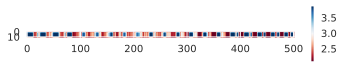

In [31]:
# plot the eps to verify
for eps in epses: 
    plt.figure(figsize=(6, 1))
    plt.imshow(np.rot90(np.abs(eps)), cmap='RdBu')
    plt.colorbar()

In [ ]:
# plot the evaluation history
# evaluation_history = np.load(evaluation_histary_file)
# plt.plot(evaluation_history)
# print(evaluation_history[-1])

**Basic Setup**

     block, center = (0,-1.85,0)
          size (22.04,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.9025,11.9025,11.9025)
     block, center = (0,-0.6,0)
          size (22.04,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (2.0736,2.0736,2.0736)
     block, center = (0,0.75,0)
          size (22.04,0.7,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (2.0736,2.0736,2.0736)
     block, center = (-8.52,0.5,0)
          size (7,0.2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (3.8416,3.8416,3.8416)
     block, center = (8.52,0.5,0)
          size (7,0.2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (3.8416,3.8416,3.8416)
     block, center = (8.88178e-16,0.5,0)
          size (10.04,0.2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
     block, center =

          dielectric constant epsilon diagonal = (3.8416,3.8416,3.8416)
     block, center = (8.52,0.5,0)
          size (7,0.2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (3.8416,3.8416,3.8416)
     block, center = (8.88178e-16,0.5,0)
          size (10.04,0.2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
     block, center = (5.02,0.5,0)
          size (0,0.2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (3.8416,3.8416,3.8416)
time for set_epsilon = 0.913538 s
-----------


MPB solved for frequency_1(1,0,0) = 0.607781 after 8 iters
MPB solved for frequency_1(2.12376,0,0) = 1.2419 after 8 iters
MPB solved for frequency_1(2.1834,0,0) = 1.27381 after 6 iters
MPB solved for frequency_1(2.18354,0,0) = 1.27389 after 3 iters
MPB solved for frequency_1(2.18354,0,0) = 1.27389 after 1 iters
     block, center = (0,-1.85,0)
          size (22.04,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.9025,11.9025,11.9025)
     block, center = (0,-0.6,0)
          size (22.04,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (2.0736,2.0736,2.0736)
     block, center = (0,0.75,0)
          size (22.04,0.7,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (2.0736,2.0736,2.0736)
     block, center = (-8.52,0.5,0)
          size (7,0.2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (3.8416,3.841

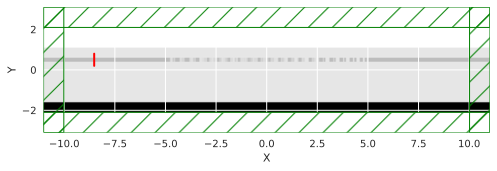

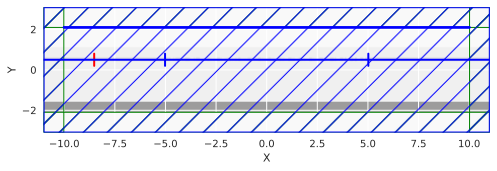

In [32]:
# if True compute flux (Gaussian source), if False compute DFT (Continue source)
compute_flux = True
# size of input and output waveguide
w = 0.5
h = 0.2

# resolution size
grid = 0.02
resolution = 1 / grid
design_res = resolution

# thickness of PML
dpml = 1

##################### length parameter ################
input_wvg_length = 5
output_wvg_length = 5
# design_region
design_region_x = np.zeros(len(epses))
for ii in range(0, len(epses)):
    design_region_x[ii] = len(epses[ii]) * (1 / design_res)
design_region_y = 0.2
sx = (
    input_wvg_length
    + np.sum(design_region_x)
    + np.sum(wg_gap)
    + output_wvg_length
    + 2 * dpml
)

##################### height parameter ################
Substrate_thickness = 0.5
BOX_thickness = 2
TOX_thickness = 0.7
near_field_height = 1
sy = BOX_thickness + TOX_thickness + Substrate_thickness + near_field_height + 2 * dpml

cell = mp.Vector3(sx, sy, 0)

# Material setting
Si = mp.Medium(index=3.45)
SiO2 = mp.Medium(index=1.44)
SiN = mp.Medium(index=1.96)

####################### geometry ##########################
Substrate_geo = mp.Block(
    material=Si,
    center=mp.Vector3(y=-0.5 * sy + 0.5 * Substrate_thickness + dpml),
    size=mp.Vector3(sx, Substrate_thickness),
)
BOX_geo = mp.Block(
    material=SiO2,
    center=mp.Vector3(y=-0.5 * sy + Substrate_thickness + 0.5 * BOX_thickness + dpml),
    size=mp.Vector3(sx, BOX_thickness),
)
TOX_geo = mp.Block(
    material=SiO2,
    center=mp.Vector3(
        y=-0.5 * sy + Substrate_thickness + BOX_thickness + 0.5 * TOX_thickness + dpml
    ),
    size=mp.Vector3(sx, TOX_thickness),
)
input_waveguide_geo = mp.Block(
    material=SiN,
    center=mp.Vector3(
        -0.5 * sx + 0.5 * input_wvg_length,
        -0.5 * sy + Substrate_thickness + BOX_thickness + 0.5 * h + dpml,
    ),
    size=mp.Vector3(input_wvg_length + 2 * dpml, h),
)
output_waveguide_geo = mp.Block(
    material=SiN,
    center=mp.Vector3(
        0.5 * sx - 0.5 * output_wvg_length,
        -0.5 * sy + Substrate_thickness + BOX_thickness + 0.5 * h + dpml,
    ),
    size=mp.Vector3(output_wvg_length + 2 * dpml, h),
)

geometry = [
    Substrate_geo,
    BOX_geo,
    TOX_geo,
    input_waveguide_geo,
    output_waveguide_geo,
]

####################### geometry ##########################

# ####################### design region ##########################
for ii in range(0, len(epses)):
    design_region_resolution_x = design_res
    design_region_resolution_y = 5  # 200nm resolution
    Nx = int(design_region_resolution_x * design_region_x[ii])
    Ny = int(design_region_resolution_y * design_region_y)
    design_variables = mp.MaterialGrid(
        mp.Vector3(Nx, Ny), SiO2, SiN, grid_type="U_DEFAULT"
    )
    design_region = mpa.DesignRegion(
        design_variables,
        volume=mp.Volume(
            center=mp.Vector3(
                -0.5 * sx
                + input_wvg_length
                + 0.5 * design_region_x[ii]
                + dpml
                + np.sum(design_region_x[0:ii])
                + np.sum(wg_gap[0:ii]),
                -0.5 * sy + Substrate_thickness + BOX_thickness + 0.5 * h + dpml,
                0,
            ),
            size=mp.Vector3(design_region_x[ii], design_region_y),
        ),
    )
    number_para = Nx * Ny
    # 初始化granting coupler为最终优化结果
    init_para = (np.abs(epses[ii][:, 5]) - 1.44**2) / (1.96**2 - 1.44**2)

    init_para[init_para > 1] = 1
    init_para[init_para < 0] = 0
    design_region.update_design_parameters(init_para)
    geometry.append(
        mp.Block(
            center=design_region.center,
            size=design_region.size,
            material=design_variables,
        )
    )
    wg_gap_geo = mp.Block(
        material=SiN,
        center=mp.Vector3(
            -0.5 * sx
            + input_wvg_length
            + dpml
            + np.sum(design_region_x[0 : (ii + 1)])
            + np.sum(wg_gap[0:ii])
            + 0.5 * wg_gap[ii],
            -0.5 * sy + Substrate_thickness + BOX_thickness + 0.5 * h + dpml,
            0,
        ),
        size=mp.Vector3(wg_gap[ii], h),
    )
    geometry.append(wg_gap_geo)
# ####################### design region ##########################

####################### Sources ##########################
wvl = 0.785
fcen = 1 / wvl
fwidth = 0.2 * fcen
kpoint = mp.Vector3(1, 0, 0)

# waveguide source
sources = [
    mp.EigenModeSource(
        mp.GaussianSource(frequency=fcen, fwidth=fwidth),
        center=input_waveguide_geo.center,
        size=mp.Vector3(0, 3 * h),
        eig_band=1,
        eig_parity=mp.EVEN_Y + mp.ODD_Z,
        eig_match_freq=True,
        direction=mp.NO_DIRECTION,
        eig_kpoint=kpoint,
    )
]
# set nomrlized source: amplitude is 1 -> flux is 1
sources[0].amplitude = 1 / mp.GaussianSource(fcen, fwidth=fwidth).fourier_transform(
    fcen
)

####################### Sources ##########################

sim = mp.Simulation(
    resolution=resolution,
    cell_size=cell,
    boundary_layers=[mp.PML(dpml)],
    sources=sources,
    geometry=geometry,
)

# ############### Monitor ###################
nfreq = 1

near_region = mp.FluxRegion(
    center=mp.Vector3(0, 0.5 * sy - dpml, 0),
    size=mp.Vector3(sx - 2 * dpml, 0),
)

near_field = sim.add_mode_monitor(
    fcen,
    0,
    1,
    near_region,
)

# near2far_field
n2f_field = sim.add_near2far(
    fcen,
    0,
    1,
    near_region,
)
near_dft = sim.add_dft_fields(
    [mp.Ez], fcen, fwidth, nfreq, center=near_region.center, size=near_region.size
)

bias_x = 0

src_region = mp.FluxRegion(
    center=mp.Vector3(
        input_waveguide_geo.center.x + (input_wvg_length / 2 + dpml),
        input_waveguide_geo.center.y,
        0,
    ),
    size=mp.Vector3(0, 3 * h, 0),
)
src_field = sim.add_mode_monitor(
    fcen,
    0,
    1,
    src_region,
)

out_region = mp.FluxRegion(
    center=mp.Vector3(
        input_waveguide_geo.center.x
        + (input_wvg_length / 2 + dpml)
        + np.sum(design_region_x)
        + np.sum(wg_gap)
        + bias_x,
        output_waveguide_geo.center.y,
        0,
    ),
    size=mp.Vector3(0, 3 * h, 0),
)
out_field = sim.add_mode_monitor(
    fcen,
    0,
    1,
    out_region,
)
wg_region = mp.FluxRegion(
    center=mp.Vector3(0, input_waveguide_geo.center.y, 0),
    size=mp.Vector3(sx, 0),
)
wg_dft = sim.add_dft_fields(
    [mp.Ez], fcen, fwidth, nfreq, center=wg_region.center, size=wg_region.size
)
field_monitor = sim.add_dft_fields(
    [mp.Ez],
    fcen,
    fwidth,
    nfreq,
    center=mp.Vector3(),
    size=mp.Vector3(sx, sy),
)
sim.plot2D(plot_monitors_flag=False)

# mpt = mp.Vector3(input_waveguide_geo.center.x - 3, input_waveguide_geo.center.y)
mpt = mp.Vector3(output_waveguide_geo.center.x - 3, input_waveguide_geo.center.y)

f = plt.figure(dpi=100)
Animate = mp.Animate2D(fields=mp.Ez, f=f, realtime=False, normalize=True)

sim.run(
    mp.at_every(1, Animate),
    until_after_sources=mp.stop_when_fields_decayed(50, mp.Ez, mpt, 1e-5),
)

In [33]:
Animate.to_jshtml(fps=1)

# 远场验证

/tmp/ipykernel_296773/3029778214.py:10: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn")


Text(0, 0.5, '$ |{E_z}|^2 $')

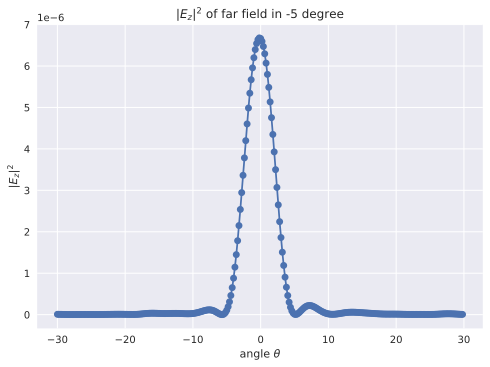

In [37]:
d_angle = 0.2
ff_distance = 1e6
ff_angle = 89
ff_number = int(2 / d_angle * ff_angle) + 1
ff_angles = np.linspace(-ff_angle, ff_angle, ff_number)
ff_points = [
    mp.Vector3(fx, ff_distance, 0) for fx in np.tan(np.radians(ff_angles)) * ff_distance
]

plt.style.use("seaborn")
n2f = []
for point in ff_points:
    ff = sim.get_farfield(n2f_field, point)
    n2f.append(ff)
rel = []  # rel中存储的是far field的强度
for ff in n2f:
    # rel.append(np.abs(ff[2]) ** 2)
    rel.append(np.abs(ff[2])**2)


plot_angle = 30  # 绘制的角度范围
figure, ax = plt.subplots()
angle_minlim = np.where(ff_angles == -plot_angle)[0][0]
angle_maxlim = np.where(ff_angles == plot_angle)[0][0]
plt.plot(ff_angles[angle_minlim:angle_maxlim], rel[angle_minlim:angle_maxlim], "-o")
plt.title(r"$ |{E_z}|^2 $ of far field in -5 degree")
ax.set_xlabel(r"angle $ \theta $")
ax.set_ylabel(r"$ |{E_z}|^2 $")
# plt.xticks([-20, -18, -16, -15])

**far field in -15 and -5 degree**

In [35]:
# save far_field date -15 degree
rel_15 = rel[angle_minlim:angle_maxlim]
print(rel_15)

[8.79644803990219e-09, 8.219120131131026e-09, 7.521339258185202e-09, 6.742406936314044e-09, 5.9268306113872864e-09, 5.121276120145394e-09, 4.3712572947252934e-09, 3.717794552503869e-09, 3.1943001617277085e-09, 2.8239570613706523e-09, 2.6178456706122443e-09, 2.574033467152205e-09, 2.6777730295846366e-09, 2.902857714345398e-09, 3.2140682921697716e-09, 3.5705202294491066e-09, 3.929607112834395e-09, 4.251147281520848e-09, 4.5012952044600436e-09, 4.6557862897877516e-09, 4.702148336155698e-09, 4.6406292239448985e-09, 4.483744295001928e-09, 4.254518458027774e-09, 3.983661215996388e-09, 3.706044586843548e-09, 3.4569322537179153e-09, 3.26842346632214e-09, 3.1665234760581524e-09, 3.16914405012542e-09, 3.2851900056551794e-09, 3.514725584641146e-09, 3.850062801465534e-09, 4.277496834261796e-09, 4.779346456603741e-09, 5.335949456013393e-09, 5.927310471609014e-09, 6.534192752002465e-09, 7.138566495104458e-09, 7.72345720169787e-09, 8.27235612154609e-09, 8.768443577927377e-09, 9.19392680829202e-09, 9.

In [22]:
# save far_field date -15 degree
rel_5 = rel[angle_minlim:angle_maxlim]
print(rel_5)

[6.608936562562627e-08, 7.389577172977148e-08, 8.170071499874926e-08, 8.936095367084431e-08, 9.672235519872686e-08, 1.036221963606131e-07, 1.0989206165056236e-07, 1.1536140952922654e-07, 1.198618513566345e-07, 1.2323215228575183e-07, 1.2532391723177173e-07, 1.2600786984577092e-07, 1.251805730586041e-07, 1.2277138179217942e-07, 1.1874936171201726e-07, 1.1312986763914953e-07, 1.0598044194013349e-07, 9.742568746871361e-08, 8.765077931539714e-08, 7.690331609385504e-08, 6.549326895428302e-08, 5.3790864992864206e-08, 4.22223344439893e-08, 3.1263555428374983e-08, 2.1431735351774763e-08, 1.3275369709311594e-08, 7.362809400729431e-09, 4.269836782787477e-09, 4.566700147360894e-09, 8.805074320681432e-09, 1.7505409217743565e-08, 3.114509259897901e-08, 5.014779702596276e-08, 7.487430542141879e-08, 1.0561502543444011e-07, 1.4258431325156293e-07, 1.8591664393761257e-07, 2.3566459138289413e-07, 2.917985211761173e-07, 3.54207862624735e-07, 4.227037976135702e-07, 4.970232070663103e-07, 5.768337155595474

Text(19.849999999999998, 0.5, '$ |{E_z}|^2 $')

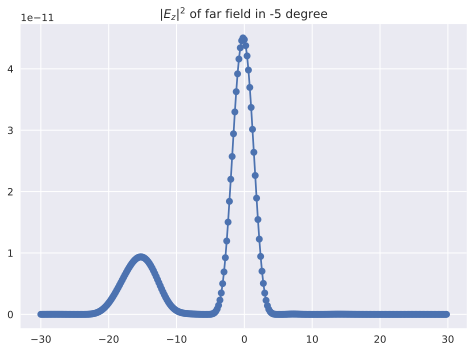

In [36]:
plt.plot(ff_angles[angle_minlim:angle_maxlim], np.abs(np.array(rel_15)+ np.array(rel_5))**2, "-o")
# plt.plot(ff_angles[angle_minlim:angle_maxlim], np.abs(np.array(rel_5))**2, "-o")
plt.title(r"$ |{E_z}|^2 $ of far field in -5 degree")
ax.set_xlabel(r"angle $ \theta $")
ax.set_ylabel(r"$ |{E_z}|^2 $")

The angle of maximum intensity is 0.0


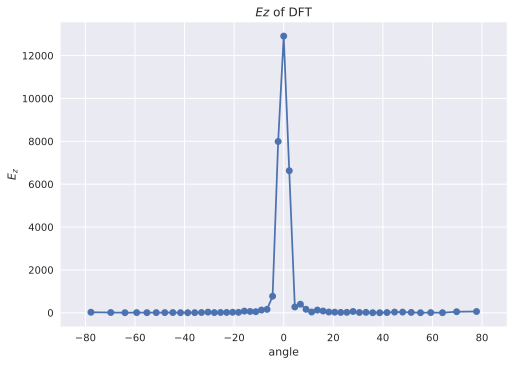

In [38]:
# fft from near field
output_dft = sim.get_dft_array(near_dft, mp.Ez, 0)
[x, y, z, w] = sim.get_array_metadata(dft_cell=near_dft)

kx = np.fft.fftshift(np.fft.fftfreq(len(x), grid))
near_field_fft = np.fft.fftshift(np.fft.fft(output_dft))

k = 1 / wvl
kx[np.abs(kx) > k] = np.nan
angle = np.arcsin(kx / k) * 180 / np.pi

figure, ax = plt.subplots()
plt.plot(angle, np.abs(near_field_fft) ** 2, "-o")
plt.title(r"$ Ez $ of DFT")
ax.set_xlabel("angle")
ax.set_ylabel(r"$ E_z $")
ax.set_xlim(-90, 90)

max_index = np.argmax(np.abs(near_field_fft) ** 2)
print(f"The angle of maximum intensity is {angle[max_index]}")

**FFT from near dft 与 far field的结果是一致的，far field更加准确，采样点更多**

Text(0.5, 1.0, 'near field')

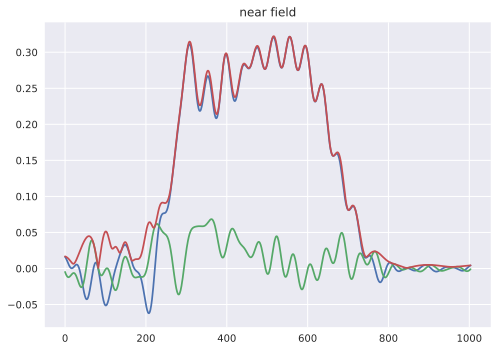

In [39]:
# near_field
near_field_data = sim.get_dft_array(near_dft, mp.Ez, 0)
plt.plot(np.real(near_field_data))
plt.plot(np.imag(near_field_data))
plt.plot(np.abs(near_field_data))
plt.title("near field")

In [ ]:
# # wg_field
# wg_field_data = sim.get_dft_array(wg_dft, mp.Ez, 0)
# [x, y, z, w] = sim.get_array_metadata(dft_cell=wg_dft)
# plt.plot(x, np.angle(wg_field_data))

In [ ]:
# plot_angle = 40  # 绘制的角度范围
# figure, ax = plt.subplots()
# angle_minlim = np.where(ff_angles == -plot_angle)[0][0]
# angle_maxlim = np.where(ff_angles == plot_angle)[0][0]
# plt.plot(ff_angles[angle_minlim:angle_maxlim], np.abs(n2f_total[angle_minlim:angle_maxlim])**2, "-o")
# plt.title(r"$ |{E_z}|^2 $ of far field")
# ax.set_xlabel(r"angle $ \theta $")
# ax.set_ylabel(r"$ |{E_z}|^2 $")

In [ ]:
# plt.plot(ff_angles, np.abs(n2f_total[:, 2])**2, "-o")

In [ ]:
# # eneygy calculated from near field
# d_length = []
# for angle in ff_angles:
#     # The length of each angle in the far field
#     length = ff_distance / np.cos(np.radians(angle))
#     d_length.append(np.radians(d_angle) * length)

# print(f"The total length {np.sum(d_length)} um calculated by angles")

# energy = 0
# for ii in range(0, ff_number, 1):
#     energy = energy + d_length[ii] * (np.abs(rel[ii]))
# print(f"The power of near_field is {energy}")

# near_field_flux = mp.get_fluxes(near_field)
# print(f"The power of near_field is {near_field_flux[0]}")

The total length 9689347.824509013 um calculated by angles
The power of near_field is 0.48056080173391047
The power of near_field is 0.4789581930812032


**mode and flux of input and output**

([<matplotlib.axis.XTick at 0x7f87c4563ed0>,
 [Text(-2.5199999999999996, 0, '−2.52'), Text(2.5200000000000005, 0, '2.52')])

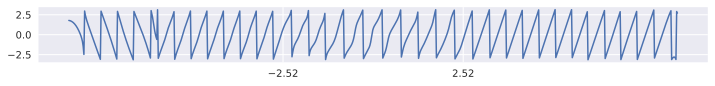

In [26]:
# wg_field
wg_field_data = sim.get_dft_array(wg_dft, mp.Ez, 0)
[x, y, z, w] = sim.get_array_metadata(dft_cell=wg_dft)
plt.figure(figsize=(12, 1))
plt.plot(x, np.angle(wg_field_data), linewidth=1.5)
plt.xticks([src_region.center.x, out_region.center.x])

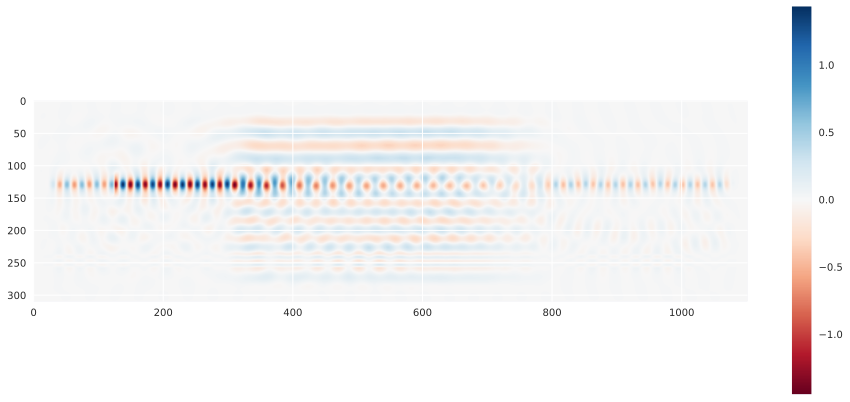

In [46]:
# wg_field
import matplotlib.cm as cm
field_data = sim.get_dft_array(field_monitor, mp.Ez, 0)
field_eps = sim.get_array(
    component=mp.Permeability, center=mp.Vector3(), size=mp.Vector3(sx, sy)
)
[x, y, z, w] = sim.get_array_metadata(dft_cell=field_monitor)
x_grid, y_grid = np.meshgrid(x, y)
plt.figure(figsize=(16, 7))
# plt.pcolormesh(x_grid, y_grid, field_eps.transpose(), cmap="binary")
plt.imshow(np.real(np.flipud(field_data.transpose())), cmap="RdBu")
plt.colorbar()

In [46]:
dY, dX = np.gradient(np.flipud(field_data.transpose()))
plt.figure(figsize=(10,10))
plt.quiver(x_grid, y_grid, dX, dY, color='y')
plt.show()

In [ ]:
src_index = np.argmin(np.abs(x-src_region.center.x))
np.angle(wg_field_data[src_index])
out_index = np.argmin(np.abs(x-out_region.center.x))
np.angle(wg_field_data[out_index])
np.angle(wg_field_data[out_index]) - np.angle(wg_field_data[src_index]) + 2*np.pi

4.876370460648646

In [ ]:
input_mode = sim.get_eigenmode_coefficients(
    src_field, [1], eig_parity=mp.EVEN_Y + mp.ODD_Z
)
input_mode_coe = np.squeeze(input_mode.alpha)
input_flux = mp.get_fluxes(src_field)
print(f"eigenmode_coe[0]计算得到的flux: {abs(input_mode_coe[0]) ** 2:.4f}")
print(f"flux计算得到的flux: {np.squeeze(input_flux):.4f}")
print(f'逆向eigenmode_coe[0]: {abs(input_mode_coe[1]) ** 2:.4f}')
print(f"正向eigenmode_coe[0]-逆向eigenmode_coe[1]: {abs(input_mode_coe[0]) ** 2 - abs(input_mode_coe[1]) ** 2:.4f}")

MPB solved for frequency_1(2.41564,0,0) = 1.39181 after 11 iters
MPB solved for frequency_1(2.19029,0,0) = 1.27302 after 6 iters
MPB solved for frequency_1(2.19192,0,0) = 1.27389 after 5 iters
MPB solved for frequency_1(2.19192,0,0) = 1.27389 after 1 iters
Dominant planewave for band 1: (2.191922,-0.000000,0.000000)
eigenmode_coe[0]计算得到的flux: 0.9650
flux计算得到的flux: 0.9467
逆向eigenmode_coe[0]: 0.0147
正向eigenmode_coe[0]-逆向eigenmode_coe[1]: 0.9503


In [ ]:
output_mode = sim.get_eigenmode_coefficients(
    out_field, [1], eig_parity=mp.EVEN_Y + mp.ODD_Z
)
output_mode_coe = np.squeeze(output_mode.alpha)
output_flux = mp.get_fluxes(out_field)
print(f"flux计算得到的flux: {np.squeeze(output_flux):.4f}")
print(f"eigenmode_coe[0]计算得到的flux: {abs(output_mode_coe[0]) ** 2:.4f}")

MPB solved for frequency_1(2.41564,0,0) = 1.39181 after 11 iters
MPB solved for frequency_1(2.19029,0,0) = 1.27302 after 6 iters
MPB solved for frequency_1(2.19192,0,0) = 1.27389 after 5 iters
MPB solved for frequency_1(2.19192,0,0) = 1.27389 after 1 iters
Dominant planewave for band 1: (2.191922,-0.000000,0.000000)
flux计算得到的flux: 0.1390
eigenmode_coe[0]计算得到的flux: 0.1263


In [ ]:
# output mode k
# k为waveguide mode的波数(空间频率)(1/wvl*neff)，而非波矢(空间角频率)(2pi/wvl*neff)
print(f"input波导mode波数: {input_mode.kdom[0].x:.4f}")
in_neff = input_mode.kdom[0].x * wvl
print(f"input波导的有效折射率in_neff: {in_neff:.4f}")

input波导mode波数: 2.1919
input波导的有效折射率in_neff: 1.7207


In [ ]:
# output mode k
# k为waveguide mode的波数(空间频率)(1/wvl*neff)，而非波矢(空间角频率)(2pi/wvl*neff)
print(f'output波导mode波数: {output_mode.kdom[0].x:.4f}')
out_neff = output_mode.kdom[0].x * wvl
print(f"output波导的有效折射率out_neff: {out_neff:.4f}")

output波导mode波数: 1.9984
output波导的有效折射率out_neff: 1.5688


In [ ]:
# angle(t)
(np.angle(output_mode_coe[0]) - np.angle(input_mode_coe[0]))  # angle(t)

4.986762074960006

In [ ]:
output_mode

EigCoeffsResult(alpha=array([[[-0.54897714+0.22272916j,  0.02250652+0.00272591j]]]), vgrp=array([0.61595591]), kpoints=[Vector3<1.9984222592286813, 0.0, 0.0>], kdom=[Vector3<1.9984222592286813, -0.0, 0.0>], cscale=array([0.50000134]))

In [ ]:
2*np.pi/wvl*5*(np.sin(np.radians(16)))-2*np.pi  # angle(t)

4.747901216254814

In [ ]:
np.sin(np.radians(15.5))

0.26723837607825685

In [ ]:
# angle of transmission -15 degree
# arg_T15 (rad)
arg_T15 = np.angle(output_mode_coe[0]) - np.angle(input_mode_coe[0])
arg_T15

4.986762074960006

$ phase_{out}-phase_{in} = 4.895886958073041(rad) $

$ n_{eff} =  $

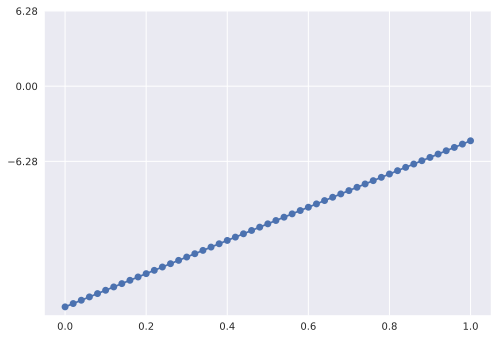

In [ ]:
# delay length (um)
# phase matching: arg_T15 + k*neff*d - k(d1+d)sin(theta) = 2*pi*m
delay_phases = []
k = 2 * np.pi / wvl

for d in np.linspace(0, 1.2, int(resolution) + 1):
    phase = (
        arg_T15
        + k * in_neff * d
        - k * (out_region.center.x - src_region.center.x + d) * np.sin(np.radians(16))
    )
    delay_phases.append(phase)
plt.plot(np.linspace(0, 1, int(resolution) + 1), delay_phases, "-o")
plt.yticks([2 * np.pi, 0, -2 * np.pi])
index = np.argmin(np.abs(np.array(delay_phases) - 2 * np.pi))

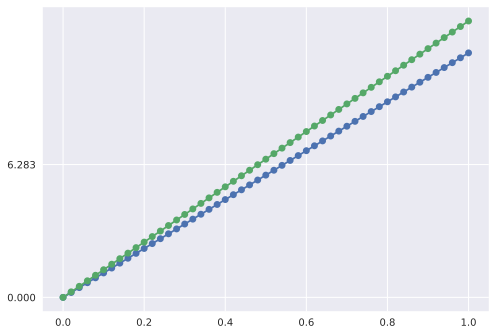

In [ ]:
# delay length (um)
# phase matching: arg_T15 + k*neff*d - k(d1+d)sin(theta) = 2*pi*m
delay_phases_16 = []
k = 2 * np.pi / wvl
for d in np.linspace(0, 1, int(resolution) + 1):
    phase = k * in_neff * d - k * d * np.sin(np.radians(16))
    delay_phases_16.append(phase)
plt.plot(np.linspace(0, 1, int(resolution) + 1), delay_phases_16, "-o")
delay_phases_5 = []
for d in np.linspace(0, 1, int(resolution) + 1):
    phase = k * in_neff * d - k * d * np.sin(np.radians(5))
    delay_phases_5.append(phase)
plt.plot(np.linspace(0, 1, int(resolution) + 1), delay_phases_5, "-o")
plt.yticks([2 * np.pi, 0])
index = np.argmin(np.abs(np.array(delay_phases_5) - 2 * np.pi))

In [ ]:
np.linspace(0, 1, int(resolution) + 1)[index]

0.48

In [ ]:
d = 0.54
k * in_neff * d - k * (d) * np.sin(np.radians(16))

6.245657276524146

In [ ]:
delay_phases[index]

6.358741412386422

In [ ]:
2*np.pi

6.283185307179586

(252, 12)


/tmp/ipykernel_319901/2047625378.py:1: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn-paper")
/home/chen/miniconda3/envs/mp/lib/python3.11/site-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


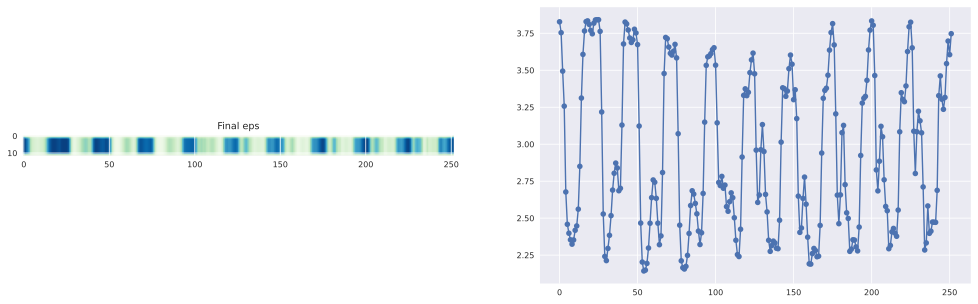

In [ ]:
plt.style.use("seaborn-paper")
eps = np.load(eps_file)
print(eps.shape)
f1, ax = plt.subplots(1, 2, figsize=(17, 5))
ax[0].imshow(np.rot90(np.abs(eps)), cmap="GnBu")
ax[0].set_title("Final eps")
ax[1].plot(eps[:, 5], "-o")

**验证目标函数值的计算是否正确**

In [ ]:
print(f"优化目标函数最终输出结构：{evaluation_history[-1]}")
# !根据segmented_opt.py中的参数进行修改
w1 = 5 * np.power(10, 4)
# angle_0index = np.where(ff_angles == scatter_angle)[0][0]
ff_distance = 1e6
fx = np.tan(np.radians(scatter_angle)) * ff_distance
ob1 = np.abs(sim.get_farfield(n2f_field, mp.Vector3(fx, ff_distance, 0))[2]) ** 2 * w1
# !根据segmented_opt.py中的参数进行修改
idea_output = 0.7333334
out = abs(output_mode_coe[0]) ** 2
w2 = 1
ob2 = -np.abs((np.abs(out) - idea_output) * w2)
ob = ob1 + ob2
print(f"验证目标函数最终输出结构：{ob}")

NameError: name 'evaluation_history' is not defined

In [ ]:
np.abs(sim.get_farfield(n2f_field, mp.Vector3(0, 1e6, 0)))

array([0.00000000e+00, 0.00000000e+00, 8.46144755e-04, 8.46144755e-04,
       5.18070431e-09, 0.00000000e+00])

# 远程验证(opt)

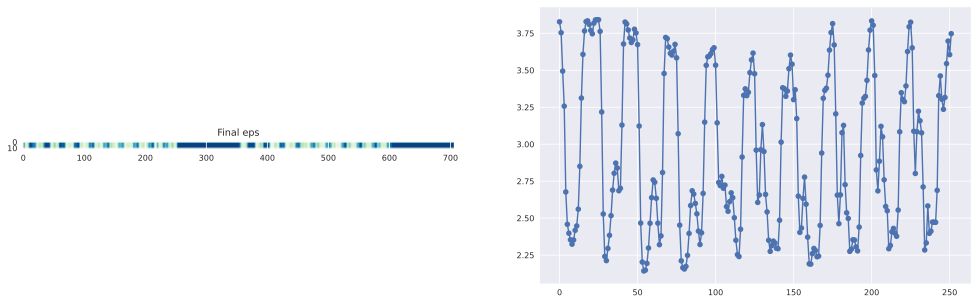

In [ ]:
eps_vf = sim.get_array(
    component=mp.Dielectric,
    frequency=fcen,
    center=mp.Vector3(
        -0.5 * sx + dpml + input_wvg_length + 0.5 * design_region_x,
        -0.5 * sy + Substrate_thickness + BOX_thickness + 0.5 * h + dpml,
        0,
    ),
    size=mp.Vector3(design_region_x, h, 0),
)
f1, ax = plt.subplots(1, 2, figsize=(17, 5))
ax[0].imshow(np.rot90(np.abs(eps_vf)), cmap="GnBu")
ax[0].set_title("Final eps")
ax[1].plot(eps[:, 5], "-o")

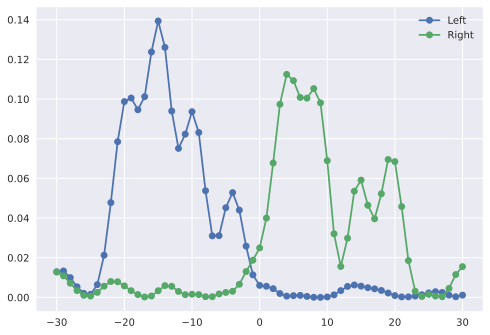

In [ ]:
# import simulation results from file 'base_simulation_Gs_back.py'
port_left_fluxes = np.load("port_left_fluxes.npy")
port_right_fluxes = np.load("port_right_fluxes.npy")
angles = np.load("angles.npy")
plt.plot(angles, np.abs(port_left_fluxes), "-o", label="Left")
plt.plot(angles, np.abs(port_right_fluxes), "-o", label="Right")
plt.legend()